2024.07.11 (목) - DAY8 데이터 시각화 2 / 이론 실습

### 히트맵(HeatMap)

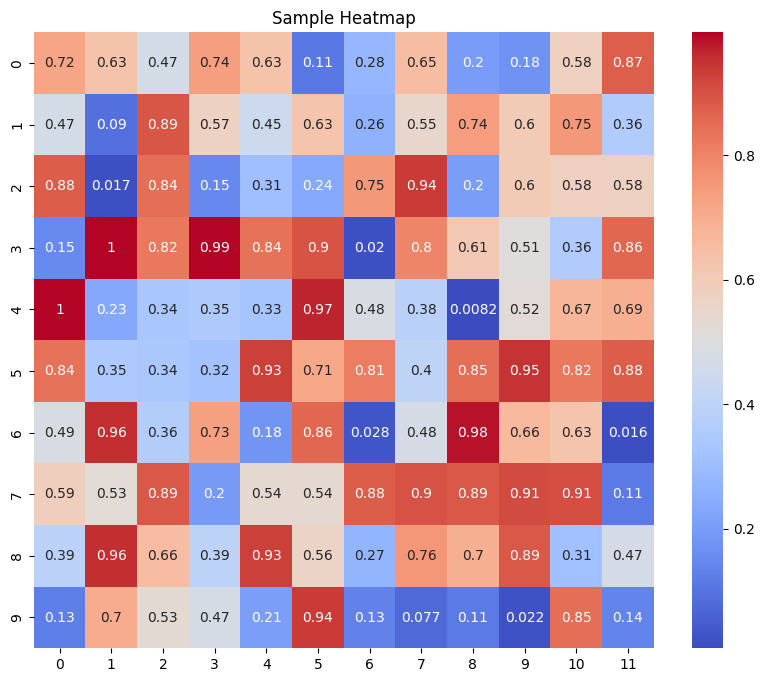

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# 샘플 데이터 생성
data = np.random.rand(10, 12) # 10x12 크기의 랜덤 값을 가진 배열 생성

# 히트맵 생성
plt.figure(figsize=(10, 8))
sns.heatmap(data, annot=True, cmap='coolwarm')
plt.title('Sample Heatmap')
plt.show()

###트리맵(TreeMap)

In [ ]:
import plotly.express as px
import numpy as np
df = px.data.gapminder().query("year == 2007")
fig = px.treemap(df, path=[px.Constant("world"), "continent", 'country'], values='pop',
                 color='lifeExp', hover_data=['iso_alpha'],
                 color_continuous_scale='RdBu',
                 color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

- path: 계층 구조를 정의합니다. 최상위는 "world", 그 다음은 "continent" (대륙), 그리고 "country" (국가)입니다.
- values: 각 사각형의 크기를 결정하는 값으로, 여기서는 인구('pop')를 사용합니다.
- color: 사각형의 색상을 결정하는 값으로, 기대 수명('lifeExp')을 사용합니다.
- hover_data: 마우스를 올렸을 때 추가로 표시될 데이터로, 여기서는 ISO 알파 코드('iso_alpha')를 포함합니다.
- color_continuous_scale: 색상 스케일을 'RdBu'로 설정합니다. 이는 빨강에서 파랑으로 변하는 색상 스케일입니다.
- color_continuous_midpoint: 색상 스케일의 중간점을 설정합니다. 여기서는 인구 가중 평균 기대 수명을 중간점으로 설정합니다.
- fig.update_layout(margin = dict(t=50, l=25, r=25, b=25)): 트리맵의 여백을 설정합니다. 위쪽 50, 왼쪽 25, 오른쪽 25, 아래쪽 25의 여백을 줍니다.

###버블차트(Bubble Chart)

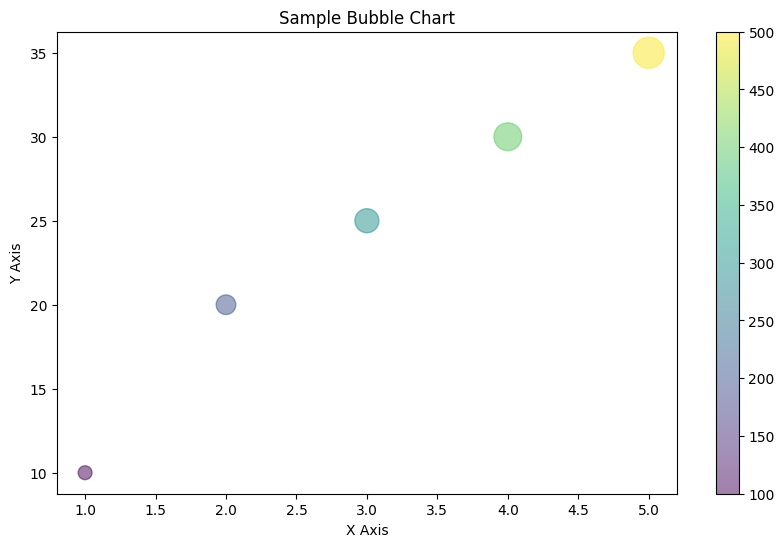

In [ ]:
import matplotlib.pyplot as plt

# 샘플 데이터 정의
x = [1, 2, 3, 4, 5]
y = [10, 20, 25, 30, 35]
sizes = [100, 200, 300, 400, 500]

# 버블 차트 생성
plt.figure(figsize=(10, 6))
plt.scatter(x, y, s=sizes, alpha=0.5, c=sizes, cmap='viridis')
plt.title('Sample Bubble Chart')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.colorbar()
plt.show()

- `plt.scatter(x, y, s=sizes, alpha=0.5, c=sizes, cmap='viridis')`: 버블 차트를 생성합니다.
    - `x`, `y`: X축과 Y축 좌표 값입니다.
    - `s=sizes`: 버블의 크기를 지정합니다.
    - `alpha=0.5`: 버블의 투명도를 지정합니다. 0은 완전히 투명, 1은 불투명입니다.
    - `c=sizes`: 버블의 색상을 지정합니다.
    - `cmap='viridis'`: 버블의 색상 맵을 'viridis'로 설정합니다. 색상 맵은 데이터 값에 따라 색상을 변환하는 방식을 정의합니다.
- 버블의 색상을 sizes 리스트로 지정하는 것은 가능합니다. 이는 버블의 크기와 색상을 동일한 값에 기반하여 시각화하는 것입니다. 이 경우, sizes 리스트의 값이 버블의 크기뿐만 아니라 색상도 결정하게 됩니다.
- plt.scatter 함수에서 c=sizes를 사용하면, sizes 리스트의 값이 버블의 색상에도 영향을 미치게 됩니다. cmap='viridis'는 색상 맵을 지정하여, sizes 값에 따라 버블의 색상을 결정합니다. 이 방식은 데이터의 두 가지 차원을 동시에 시각화할 때 유용할 수 있습니다.

###Rader Chart

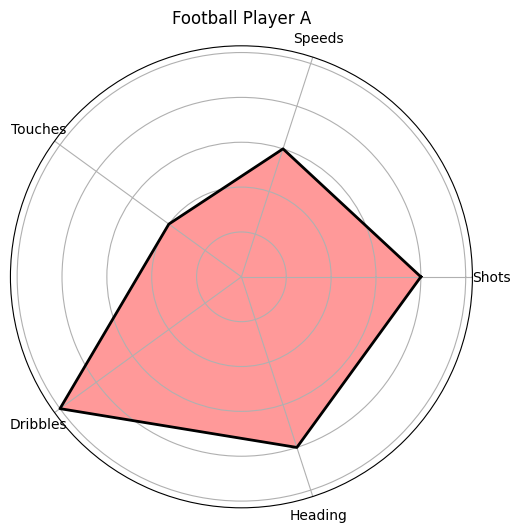

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 샘플 데이터 정의
labels = ['Shots', 'Speeds', 'Touches', 'Dribbles', 'Heading']
values = [4, 3, 2, 5, 4]
values += values[:1]
angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]

# 레이더 차트 생성
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='red', alpha=0.4)
ax.plot(angles, values, color='black', linewidth=2)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title('Football Player A')
plt.show()

1. **샘플 데이터 정의**:
    
    ```python
    labels = ['Shots', 'Speeds', 'Touches', 'Dribbles', 'Heading']
    values = [4, 3, 2, 5, 4]
    ```
    
    - `labels`는 축구 선수의 능력을 나타내는 라벨 리스트입니다.
    - `values`는 각 능력에 대한 평가 점수입니다.
2. **첫 번째 값 추가**:
    
    ```python
    values += values[:1]
    ```
    
    - 레이더 차트는 닫힌 모양을 가지기 때문에, 첫 번째 값을 리스트의 끝에 추가합니다. 이는 레이더 차트의 마지막 점과 첫 번째 점을 연결하기 위함입니다.
3. **각도 계산**:
    
    ```python
    angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False).tolist()
    angles += angles[:1]
    ```
    
    - `angles`는 각 라벨의 각도를 계산합니다. `np.linspace`는 0부터 2π(360도)까지 균등하게 분포된 각도를 생성합니다.
    - `angles += angles[:1]`은 마찬가지로 각 리스트의 첫 번째 값을 끝에 추가하여 닫힌 모양을 만듭니다.
4. **레이더 차트 생성**:
    
    ```python
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    ```
    
    - `fig`와 `ax`는 각각 그림과 축을 나타냅니다.
    - `subplot_kw=dict(polar=True)`는 이 서브플롯을 극좌표 시스템으로 설정합니다.
5. **데이터 그리기**:
    
    ```python
    ax.fill(angles, values, color='red', alpha=0.4)
    ax.plot(angles, values, color='black', linewidth=2)
    ```
    
    - `ax.fill`은 채워진 다각형을 그리고, `ax.plot`은 외곽선을 그립니다.
    - `color`와 `alpha`는 색상과 투명도를 설정합니다.
6. **레이블 설정**:
    
    ```python
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ```
    
    - `ax.set_yticklabels([])`은 y축 레이블을 숨깁니다.
    - `ax.set_xticks`와 `ax.set_xticklabels`은 각 축에 라벨을 설정합니다.
7. **제목 설정 및 차트 표시**:
    
    ```python
    plt.title('Football Player A')
    plt.show()
    ```
    
    - `plt.title`은 차트 제목을 설정합니다.
    - `plt.show`는 차트를 화면에 표시합니다.

이 코드는 축구 선수의 여러 능력을 시각적으로 비교할 수 있도록 해줍니다. 각 능력은 방사형 축을 따라 배치되고, 능력 값에 따라 다각형의 형태가 결정됩니다.

###Sanky Diagram

In [ ]:
import plotly.graph_objects as go

# 샘플 데이터 정의
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=["A", "B", "C", "D", "E", "F"],
        color=["blue", "blue", "blue", "blue", "blue", "blue"]
    ),
    link = dict(
        source=[0, 1, 0, 2, 3, 3],
        target=[2, 3, 3, 4, 4, 5],
        value=[8, 4, 2, 8, 4, 2]
    )
))

fig.update_layout(title_text="Sample Sankey Diagram", font_size=10)
fig.show()

위의 코드는 Plotly 라이브러리를 사용하여 Sankey 다이어그램을 생성하는 방법을 보여줍니다. Sankey 다이어그램은 흐름의 크기를 보여주는 도식으로, 노드와 링크로 구성됩니다.

1. **Plotly 라이브러리 임포트**:
    
    ```python
    import plotly.graph_objects as go
    ```
    
    - Plotly의 그래프 객체를 가져옵니다. 이는 대화형 그래프를 만들 수 있는 라이브러리입니다.
2. **Sankey 다이어그램 데이터 정의**:
    
    ```python
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=["A", "B", "C", "D", "E", "F"],
            color=["blue", "blue", "blue", "blue", "blue", "blue"]
        ),
        link=dict(
            source=[0, 1, 0, 2, 3, 3],
            target=[2, 3, 3, 4, 4, 5],
            value=[8, 4, 2, 8, 4, 2]
        )
    ))
    ```
    
    - `go.Figure(go.Sankey(...))`는 Sankey 다이어그램을 생성하는 객체입니다.
    - `node`와 `link`는 각각 노드와 링크를 정의합니다.
    
    **노드 정의**:
    
    - `pad=15`: 노드 간의 간격을 설정합니다.
    - `thickness=20`: 노드의 두께를 설정합니다.
    - `line=dict(color="black", width=0.5)`: 노드 테두리의 색상과 두께를 설정합니다.
    - `label=["A", "B", "C", "D", "E", "F"]`: 각 노드의 라벨을 설정합니다.
    - `color=["blue", "blue", "blue", "blue", "blue", "blue"]`: 각 노드의 색상을 설정합니다.
    
    **링크 정의**:
    
    - `source=[0, 1, 0, 2, 3, 3]`: 각 링크의 출발 노드를 설정합니다. 여기서 숫자는 `label` 리스트의 인덱스를 의미합니다.
    - `target=[2, 3, 3, 4, 4, 5]`: 각 링크의 도착 노드를 설정합니다.
    - `value=[8, 4, 2, 8, 4, 2]`: 각 링크의 값(흐름의 크기)을 설정합니다.
3. **레이아웃 업데이트**:
    
    ```python
    fig.update_layout(title_text="Sample Sankey Diagram", font_size=10)
    ```
    
    - `update_layout` 메서드는 그래프의 레이아웃을 업데이트합니다.
    - `title_text="Sample Sankey Diagram"`: 다이어그램의 제목을 설정합니다.
    - `font_size=10`: 글꼴 크기를 설정합니다.
4. **다이어그램 표시**:
    
    ```python
    fig.show()
    ```
    
    - `show` 메서드는 다이어그램을 화면에 표시합니다.

이 코드는 Sankey 다이어그램을 사용하여 데이터의 흐름을 시각적으로 표현합니다. 각 노드는 데이터를 나타내며, 링크는 노드 간의 흐름을 나타냅니다. Sankey 다이어그램은 데이터 흐름의 비율과 양을 직관적으로 보여주기 때문에 복잡한 시스템의 시각화에 유용합니다.

###인터렉티브 시각화(확대)

In [ ]:
import plotly.express as px
import pandas as pd

# 샘플 데이터 생성
data = {
    'Month': ['January', 'February', 'March', 'April', 'May', 'June'],
    'Sales': [150, 200, 180, 220, 250, 230]
}
df = pd.DataFrame(data)

# 인터랙티브 선 그래프 생성
fig = px.line(df, x='Month', y='Sales', title='Monthly Sales')
fig.show()

위의 코드는 Plotly Express와 pandas를 사용하여 인터랙티브 선 그래프를 생성하는 방법을 보여줍니다.

1. **필요한 라이브러리 임포트**:
    
    ```python
    import plotly.express as px
    import pandas as pd
    ```
    
    - `plotly.express`는 간단하고 직관적으로 그래프를 그릴 수 있는 Plotly의 서브 패키지입니다.
    - `pandas`는 데이터 조작과 분석에 사용되는 라이브러리입니다.
2. **샘플 데이터 생성**:
    
    ```python
    data = {
        'Month': ['January', 'February', 'March', 'April', 'May', 'June'],
        'Sales': [150, 200, 180, 220, 250, 230]
    }
    df = pd.DataFrame(data)
    ```
    
    - `data`는 월별 판매량을 나타내는 샘플 데이터입니다.
    - `pandas.DataFrame(data)`를 사용하여 데이터를 데이터프레임 형태로 변환합니다.
3. **인터랙티브 선 그래프 생성**:
    
    ```python
    fig = px.line(df, x='Month', y='Sales', title='Monthly Sales')
    ```
    
    - `px.line` 함수는 선 그래프를 생성합니다.
    - `df`는 사용할 데이터프레임을 지정합니다.
    - `x='Month'`는 x축에 사용할 열을 지정합니다.
    - `y='Sales'`는 y축에 사용할 열을 지정합니다.
    - `title='Monthly Sales'`는 그래프의 제목을 설정합니다.
4. **그래프 표시**:
    
    ```python
    fig.show()
    ```
    
    - `show` 메서드는 생성된 그래프를 화면에 표시합니다.

이 코드는 월별 판매량을 시각화하는 선 그래프를 생성합니다. 각 월의 판매량을 점으로 표시하고, 이 점들을 선으로 연결하여 판매량의 변화를 시각적으로 보여줍니다. Plotly Express를 사용하면 그래프가 기본적으로 인터랙티브하게 되어 있어, 마우스로 그래프를 탐색하거나 확대/축소할 수 있습니다.

###시각화 요소를 통한 설득력 있는 이야기 구성

- 시각적 강조

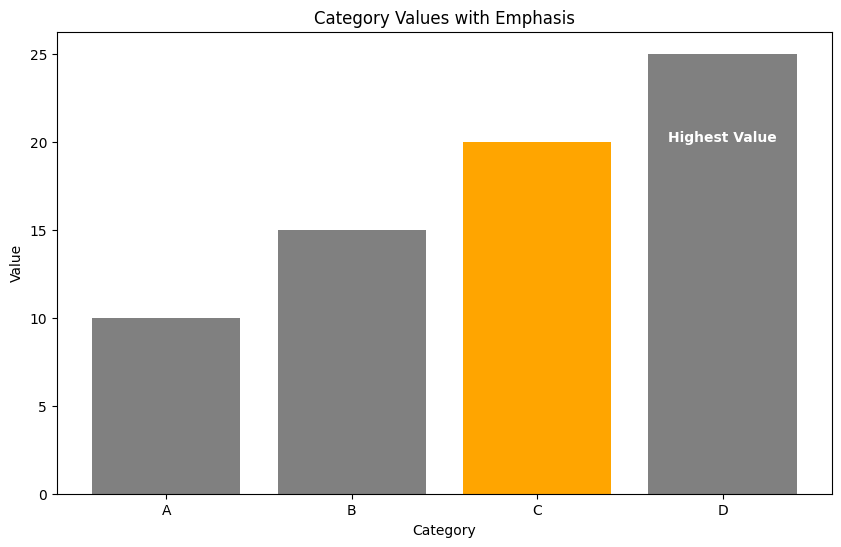

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
categories = ['A', 'B', 'C', 'D']
values = [10, 15, 20, 25]

# 강조할 데이터
highlight = [False, False, True, False]

# 그래프 생성
plt.figure(figsize=[10, 6])
bars = plt.bar(categories, values, color=['grey' if not h else 'orange' for h in highlight])
plt.title('Category Values with Emphasis')
plt.xlabel('Category')
plt.ylabel('Value')

# 강조할 데이터 포인트에 텍스트 추가
for bar in bars:
    if bar.get_height() == max(values):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 5,
                 'Highest Value', ha='center', color='white', weight='bold')

plt.show()

- plt.bar(categories, values, color=['grey' if not h else 'orange' for h in highlight])는 막대 그래프를 생성합니다. highlight 리스트를 사용하여 강조할 데이터 포인트의 색상을 설정합니다. 강조되지 않은 데이터는 회색(grey), 강조된 데이터는 주황색(orange)으로 설정합니다.
- 'if bar.get_height() == max(values)'는 막대의 높이가 가장 높은 값인지 확인합니다.
- 'plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 5, 'Highest Value', ha='center', color='white', weight='bold')'는 강조할 데이터 포인트에 텍스트를 추가합니다. 텍스트의 위치는 막대의 중앙에 설정되고, 텍스트의 색상은 흰색('white'), 글자 두께는 'bold'로 설정됩니다.

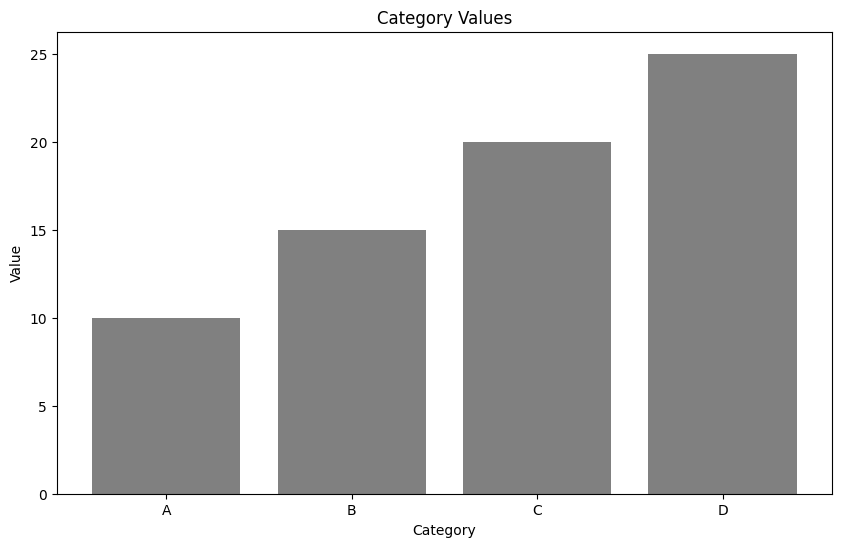

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
categories = ['A', 'B', 'C', 'D']
values = [10, 15, 20, 25]

# 그래프 생성
plt.figure(figsize=(10, 6))
plt.bar(categories, values, color='grey')
plt.title('Category Values')
plt.xlabel('Category')
plt.ylabel('Value')
plt.show()

###시각화 요소를 통한 설득력 있는 이야기 구성

- 애니메이션

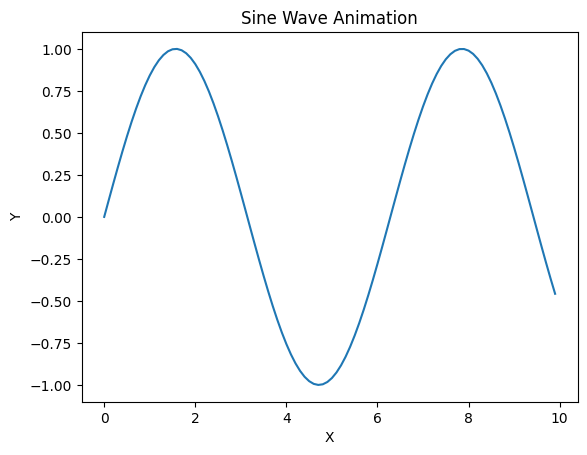

In [ ]:
from IPython.display import HTML

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

# 데이터 정의
fig, ax = plt.subplots()
x = np.arange(0, 10, 0.1)
line, = ax.plot(x, np.sin(x))

# 애니메이션 함수
def update(num, x, line):
    line.set_ydata(np.sin(x + num / 10.0))
    return line,

ani = animation.FuncAnimation(fig, update, frames=100, fargs=[x, line], interval=50)
plt.title('Sine Wave Animation')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

plt.close()  # Prevent the static image from displaying

# 애니메이션 객체를 HTML로 변환하여 표시
HTML(ani.to_jshtml())

1. `from IPython.display import HTML`: Jupyter Notebook에서 HTML로 애니메이션을 표시하기 위해 필요한 모듈을 임포트합니다.
2. `%matplotlib inline`: 그래프를 인라인으로 표시합니다.
3. `plt.subplots()`, `np.arange()`, `ax.plot()`: 그래프와 데이터를 정의합니다.
4. `update` 함수: 애니메이션의 각 프레임을 업데이트하는 함수입니다.
5. `animation.FuncAnimation`: 애니메이션 객체를 생성하고 변수 `ani`에 할당하여 유지합니다.
6. `plt.title()`, `plt.xlabel()`, `plt.ylabel()`: 그래프의 제목과 레이블을 설정합니다.
7. `plt.close()`: 정적 이미지를 표시하지 않도록 그림을 닫습니다.
8. `HTML(ani.to_jshtml())`: 애니메이션 객체를 HTML로 변환하여 Jupyter Notebook에서 표시합니다.

In [ ]:
from matplotlib import rc
rc('animation', html='jshtml')
ani

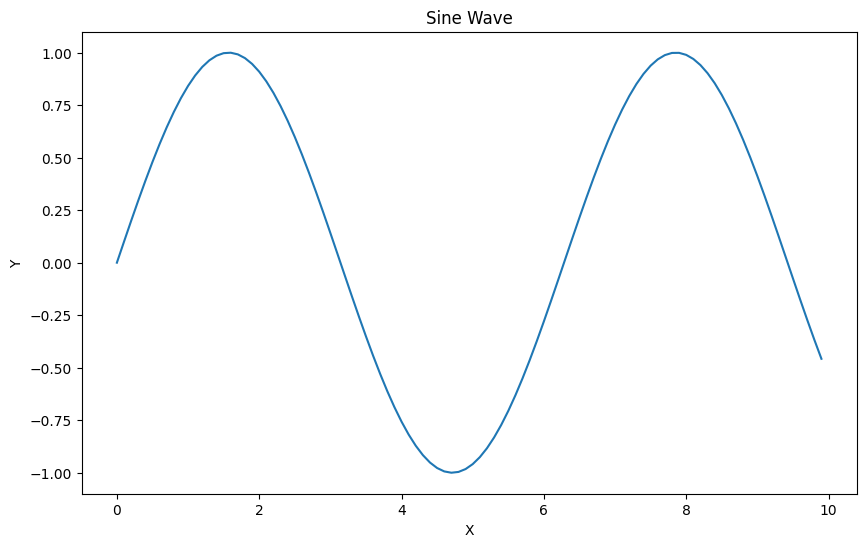

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 데이터 정의
x = np.arange(0, 10, 0.1)
y = np.sin(x)

# 그래프 생성
plt.figure(figsize=(10, 6))
plt.plot(x, y)
plt.title('Sine Wave')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

###시각화 요소를 통한 설득력 있는 이야기 구성
- 비주얼 히스토리

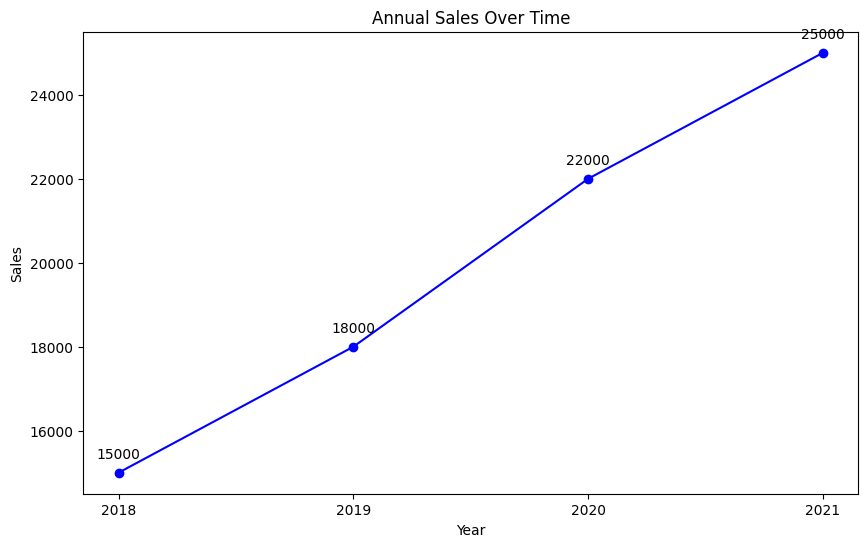

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
years = ['2018', '2019', '2020', '2021']
sales = [15000, 18000, 22000, 25000]

# 그래프 생성
plt.figure(figsize=(10, 6))
plt.plot(years, sales, marker='o', linestyle='-', color='b')
plt.title('Annual Sales Over Time')
plt.xlabel('Year')
plt.ylabel('Sales')

for i, txt in enumerate(sales):
    plt.annotate(txt, (years[i], sales[i]), textcoords="offset points", xytext=(0,10), ha='center')
    # textcoords="offset points"는 텍스트 좌표가 오프셋 포인트 단위임
    # xytext=(0, 10)은 기본 위치에서 x축으로 0 포인트, y축으로 10 포인트 만큼 텍스트를 이동시키겠다는 뜻
plt.show()

- plt.plot(years, sales, marker='o', linestyle='-', color='b')는 선 그래프를 생성합니다.
    - years는 x축 데이터입니다.
    - sales는 y축 데이터입니다.
    - marker='o'는 데이터 포인트를 원 모양으로 표시합니다.
    - linestyle='-'는 실선 스타일을 지정합니다.
    - color='b'는 선 색상을 파란색으로 설정합니다.
- for i, txt in enumerate(sales):는 sales 리스트의 각 항목에 대해 반복합니다.
    - i는 현재 인덱스입니다.
    - txt는 현재 판매량 값입니다.
- plt.annotate(txt, (years[i], sales[i]), textcoords="offset points", xytext=(0,10), ha='center')는 각 데이터 포인트에 텍스트를 추가합니다.
    - txt는 추가할 텍스트입니다.
    - (years[i], sales[i])는 텍스트를 추가할 위치입니다.
    - textcoords="offset points"는 텍스트 좌표가 오프셋 포인트 단위임을 나타냅니다.
    - xytext=(0,10)는 텍스트 위치를 데이터 포인트에서 x축으로 0, y축으로 10 포인트 떨어뜨려 배치합니다.
    - ha='center'는 텍스트를 수평으로 가운데 정렬합니다.

오프셋 포인트 단위는 matplotlib에서 텍스트 또는 기타 그래픽 요소를 배치할 때 사용되는 좌표계의 일종입니다. 이를 통해 텍스트 위치를 데이터 포인트와 일정한 거리만큼 떨어뜨려 조절할 수 있습니다.


- 시각적 이해:
    - 기본 위치: 텍스트가 위치할 데이터 포인트 (years[i], sales[i])입니다.
    - 오프셋 적용: xytext=(0, 10)은 기본 위치에서 x축으로 0 포인트, y축으로 10 포인트 만큼 텍스트를 이동시키겠다는 뜻입니다. 이는 텍스트가 데이터 포인트 바로 위에 조금 떨어진 곳에 배치되도록 합니다.
    
이 방식을 사용하면 데이터 포인트와 텍스트가 겹치지 않도록 하여 그래프를 더 명확하게 만들 수 있습니다. textcoords 인수는 다양한 값을 가질 수 있으며, 각 값은 다른 기준을 사용하여 텍스트의 위치를 지정합니다. offset points는 그중 하나로, 포인트 단위를 기준으로 한 오프셋을 제공합니다.

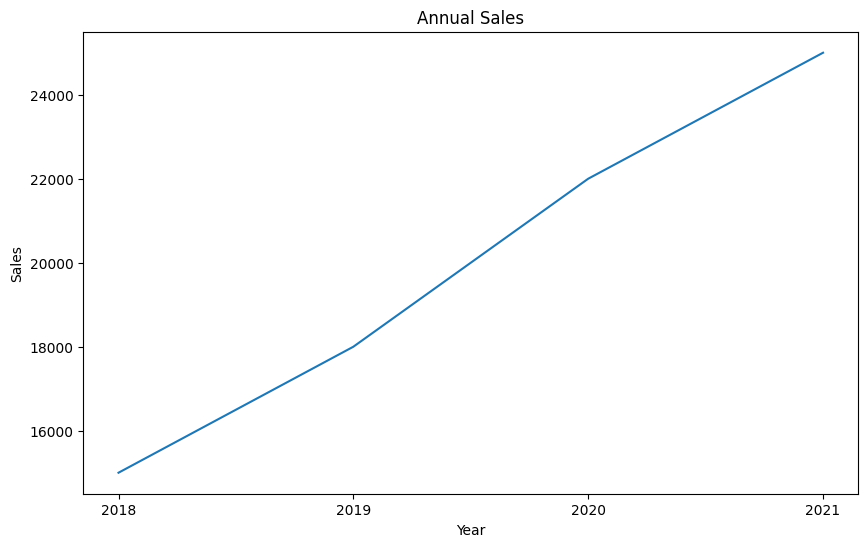

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
years = ['2018', '2019', '2020', '2021']
sales = [15000, 18000, 22000, 25000]

# 그래프 새성
plt.figure(figsize=(10, 6))
plt.plot(years, sales)
plt.title('Annual Sales')
plt.xlabel('Year')
plt.ylabel('Sales')
plt.show()

###혼란스러움
- 데이터가 명확하지 않고, 불필요한 요소로 인해 혼란

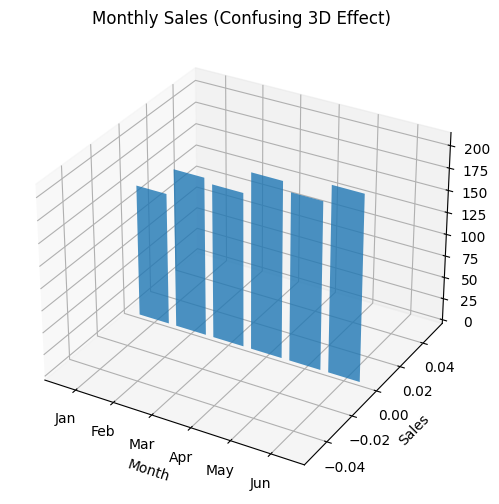

In [ ]:
# 데이터 정의
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
sales = [150, 180, 175, 200, 190, 210]

# 그래프 생성 (나쁜 예시)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.bar(months, sales, zs=0, zdir='y', alpha=0.8)
ax.set_title('Monthly Sales (Confusing 3D Effect)')
ax.set_xlabel('Month')
ax.set_ylabel('Sales')
plt.show()

###불필요한 복잡성

지나치게 복잡한 그래프는 데이터를 이해하기 어렵게 만듦

여러 종류의 데이터를 한 그래프에 표시하여 이해하기 어려운 경우

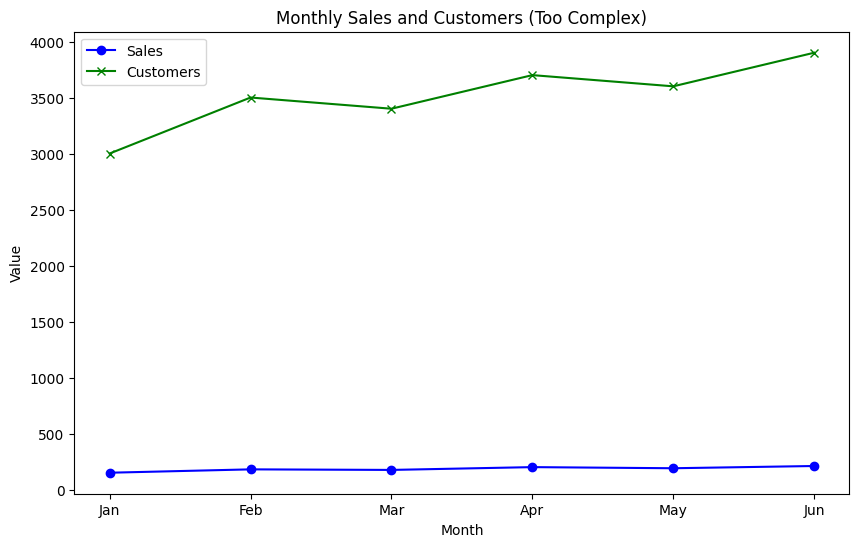

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
sales = [150, 180, 175, 200, 190, 210]
customers = [3000, 3500, 3400, 3700, 3600, 3900]

# 그래프 생성 (나쁜 예시)
plt.figure(figsize=(10, 6))
plt.plot(months, sales, marker='o', label='Sales', color='blue')
plt.plot(months, customers, marker='x', label='Customers', color='green')
plt.title('Monthly Sales and Customers (Too Complex)')
plt.xlabel('Month')
plt.ylabel('Value')
plt.legend()
plt.show()

###왜곡된 데이터

데이터의 축을 잘못 설정하거나, 특정 데이터를 과장하여 왜곡된 메시지를 전달

반품률을 과장하기 위해 Y축 범위를 잘못 설정한 경우

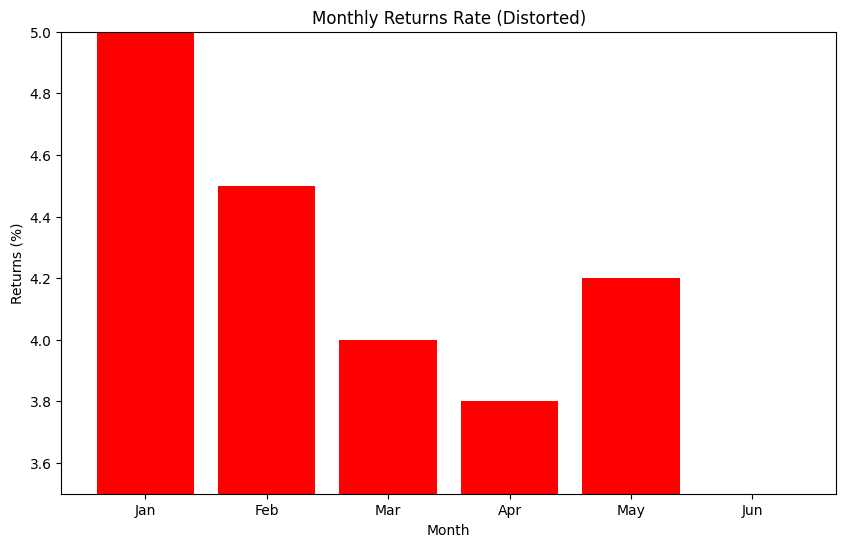

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
returns = [5, 4.5, 4, 3.8, 4.2, 3.5]

# 그래프 생성 (나쁜 예시)
plt.figure(figsize=(10, 6))
plt.bar(months, returns, color='red')
plt.title('Monthly Returns Rate (Distorted)')
plt.xlabel('Month')
plt.ylabel('Returns (%)')
plt.ylim(3.5, 5) # Y축 범위를 잘못 설정함
plt.show()

###잘못된 차트 유형

데이터의 특성에 맞지 않는 차트 유형을 선택하여 데이터를 오해하게 할 수 있음

월별 매출 변화를 파이 차트로 표현한 경우

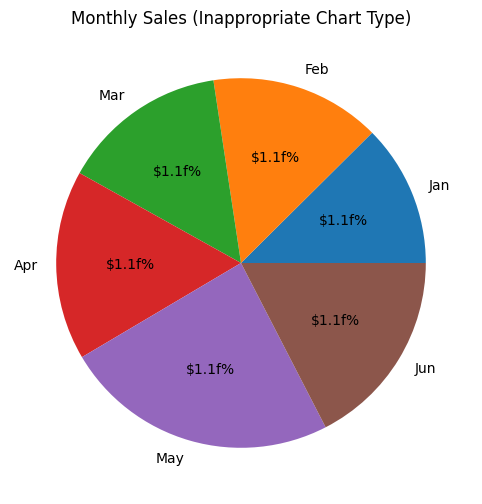

In [ ]:
import matplotlib.pyplot as plt

# 데이터 정의
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun']
sales = [150, 180, 175, 200, 290, 210]

# 그래프 생성 (나쁜 예시)
plt.figure(figsize=(10, 6))
plt.pie(sales, labels=months, autopct='$1.1f%%')
plt.title('Monthly Sales (Inappropriate Chart Type)')
plt.show()